In [8]:
#Imports
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import altair as alt


In [3]:
#Read
ames = pd.read_csv('../data/clean_ames.csv')
pd.set_option('display.max_rows', None)

In [4]:
#Drop unnamed and snake case
ames = ames.drop(columns = ['Unnamed: 0'])
ames.columns = ames.columns.str.replace(" ", "_").str.lower()

In [48]:
#ames.to_csv('../data/tab_ames.csv')

In [5]:
ames.head()

,id,pid,ms_subclass,ms_zoning,lot_frontage,lot_area,street,alley,lot_shape,land_contour,...,screen_porch,pool_area,pool_qc,fence,misc_feature,misc_val,mo_sold,yr_sold,sale_type,saleprice
0,109,533352170,60,RL,69.0,13517,Pave,None,IR1,Lvl,...,0,0,No,No,No,0,3,2010,WD,130500
1,544,531379050,60,RL,43.0,11492,Pave,None,IR1,Lvl,...,0,0,No,No,No,0,4,2009,WD,220000
2,153,535304180,20,RL,68.0,7922,Pave,None,Reg,Lvl,...,0,0,No,No,No,0,1,2010,WD,109000
3,318,916386060,60,RL,73.0,9802,Pave,None,Reg,Lvl,...,0,0,No,No,No,0,4,2010,WD,174000
4,255,906425045,50,RL,82.0,14235,Pave,None,IR1,Lvl,...,0,0,No,No,No,0,3,2010,WD,138500


In [6]:
#Confirming nulls are gone
ames.isnull().sum()

id                 0
pid                0
ms_subclass        0
ms_zoning          0
lot_frontage       0
lot_area           0
street             0
alley              0
lot_shape          0
land_contour       0
utilities          0
lot_config         0
land_slope         0
neighborhood       0
condition_1        0
condition_2        0
bldg_type          0
house_style        0
overall_qual       0
overall_cond       0
year_built         0
year_remod/add     0
roof_style         0
roof_matl          0
exterior_1st       0
exterior_2nd       0
mas_vnr_type       0
mas_vnr_area       0
exter_qual         0
exter_cond         0
foundation         0
bsmt_qual          0
bsmt_cond          0
bsmt_exposure      0
bsmtfin_type_1     0
bsmtfin_sf_1       0
bsmtfin_type_2     0
bsmtfin_sf_2       0
bsmt_unf_sf        0
total_bsmt_sf      0
heating            0
heating_qc         0
central_air        0
electrical         0
1st_flr_sf         0
2nd_flr_sf         0
low_qual_fin_sf    0
gr_liv_area  

In [44]:
ames.dtypes

id                   int64
pid                  int64
ms_subclass          int64
ms_zoning           object
lot_frontage       float64
lot_area             int64
street              object
alley               object
lot_shape           object
land_contour        object
utilities           object
lot_config          object
land_slope          object
neighborhood        object
condition_1         object
condition_2         object
bldg_type           object
house_style         object
overall_qual         int64
overall_cond         int64
year_built           int64
year_remod/add       int64
roof_style          object
roof_matl           object
exterior_1st        object
exterior_2nd        object
mas_vnr_type        object
mas_vnr_area       float64
exter_qual          object
exter_cond          object
foundation          object
bsmt_qual           object
bsmt_cond           object
bsmt_exposure       object
bsmtfin_type_1      object
bsmtfin_sf_1       float64
bsmtfin_type_2      object
b

## _EDA:_

C:\Users\13175\anaconda3-1\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


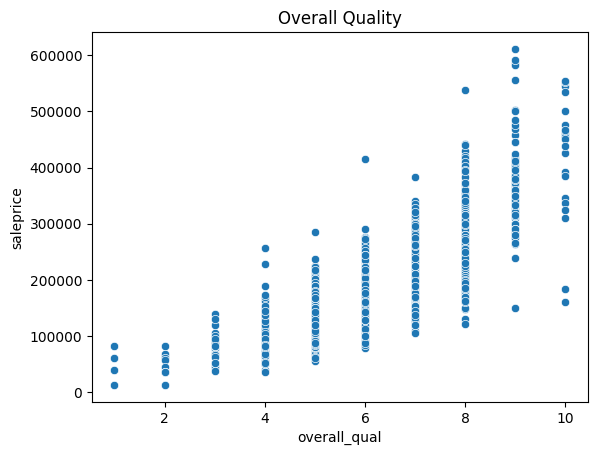

In [24]:
sns.scatterplot(ames['overall_qual'], ames.saleprice).set(title = 'Overall Quality');

In [23]:
chart = alt.Chart(ames).mark_circle(color = 'teal').encode(
    alt.X('saleprice:Q', bin=alt.Bin(maxbins=100),axis = alt.Axis(title="Sale Price")),
    alt.Y('overall_qual:Q'),
    ).properties(width = 800, height=500, title = 'Scatter of Sale Price and Overall Quality').interactive()
chart

alt.Chart(...)

C:\Users\13175\anaconda3-1\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


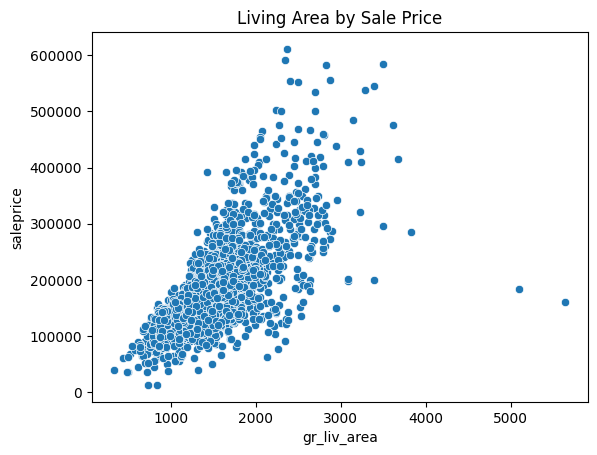

In [11]:
sns.scatterplot(ames['gr_liv_area'], ames.saleprice).set(title = "Living Area by Sale Price");

In [12]:
chart = alt.Chart(ames).mark_circle(color = 'teal').encode(
    alt.X('year_built:Q', bin=alt.Bin(maxbins=150),axis = alt.Axis(title="Year Built")),
    alt.Y('saleprice:Q'),
    color = alt.Color('half_bath:Q', scale=alt.Scale(range=["#e377c2","#1f77b4"]))
   ).properties(width = 800, height=500, title = 'Scatter of Sale Price Across the Years').interactive()
chart

alt.Chart(...)

In [13]:
chart = alt.Chart(ames).mark_bar(color = 'teal').encode(
    alt.X('year_built:Q', bin=alt.Bin(maxbins=150),axis = alt.Axis(title="Year Built")),
    alt.Y('saleprice:Q'),
    
   ).properties(width = 700, height=200 ,title = 'Year Built vs Sale Price'
)
chart.configure_header(
    titleColor='green',
    titleFontSize=14,
    labelColor='red',
    labelFontSize=14
    
)
chart

alt.Chart(...)

## _Preprocessing:_

The below function is one that I developed for ease of use when one hot encoding variables for later modeling.

One_hot_encode Function:
    
    1. Takes in dataframe
    2. Creates an empty df for the one hot encoded columns
    3. Loops through df columns and checks for object dtype or categorical
    4. Fit and transforms those columns with OneHotEncoder
    5. Concatenates each ohe column to the empty df created in function
    6. Diplays head on return


In [45]:
def one_hot_encode(df):
    # create an empty dataframe to store the one hot encoded columns
    one_hot_df = pd.DataFrame()
    
    # loop through the columns of the dataframe
    for col in df.columns:
        # check if the data type of the column is object or categorical
        if df[col].dtype == 'object' or pd.api.types.is_categorical_dtype(df[col]):
            # create a one hot encoder object
            enc = OneHotEncoder(drop='first')
            # fit and transform the column using the one hot encoder
            one_hot_col = pd.DataFrame(enc.fit_transform(df[[col]]).toarray(), columns=enc.get_feature_names_out([col]))
            # concatenate the one hot encoded column to the one hot dataframe
            one_hot_df = pd.concat([one_hot_df, one_hot_col], axis=1)
        else:
            # if the data type of the column is not object or categorical, concatenate the original column to the one hot dataframe
            one_hot_df = pd.concat([one_hot_df, df[col]], axis=1)
    
    return one_hot_df

In [46]:
model_df = one_hot_encode(ames)

In [47]:
model_df.head(100)

,id,pid,ms_subclass,ms_zoning_C (all),ms_zoning_FV,ms_zoning_I (all),ms_zoning_RH,ms_zoning_RL,ms_zoning_RM,lot_frontage,...,yr_sold,sale_type_CWD,sale_type_Con,sale_type_ConLD,sale_type_ConLI,sale_type_ConLw,sale_type_New,sale_type_Oth,sale_type_WD,saleprice
0,109,533352170,60,0.0,0.0,0.0,0.0,1.0,0.0,69.0,...,2010,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,130500
1,544,531379050,60,0.0,0.0,0.0,0.0,1.0,0.0,43.0,...,2009,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,220000
2,153,535304180,20,0.0,0.0,0.0,0.0,1.0,0.0,68.0,...,2010,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,109000
3,318,916386060,60,0.0,0.0,0.0,0.0,1.0,0.0,73.0,...,2010,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,174000
4,255,906425045,50,0.0,0.0,0.0,0.0,1.0,0.0,82.0,...,2010,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,138500
5,138,535126040,20,0.0,0.0,0.0,0.0,1.0,0.0,137.0,...,2010,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,190000
6,2827,908186070,180,0.0,0.0,0.0,0.0,0.0,1.0,35.0,...,2006,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,140000
7,145,535154050,20,0.0,0.0,0.0,0.0,1.0,0.0,69.0,...,2010,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,142000
8,1942,535353130,20,0.0,0.0,0.0,0.0,1.0,0.0,69.0,...,2007,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,112500
9,1956,535426130,60,0.0,0.0,0.0,0.0,1.0,0.0,70.0,...,2007,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,135000


In [38]:
model_df.to_csv('../data/model_df.csv', index =False)